# Change detection tutorial

Official dataset repo: https://github.com/S2Looking/Dataset

Paper related to this dataset: https://www.mdpi.com/2072-4292/12/10/1662

For this notebook, I downloaded the dataset from kaggle: [kaggle: LEVIR-CD](https://www.kaggle.com/datasets/teju866/levir-cd-dataset)

*Please note that, this dataset can be use only for the acadamic propose, not for the commercial propose.*

## Download dataset

In [1]:
# download and unzip data from data link
import kagglehub

# Download latest version
path = kagglehub.dataset_download("teju866/levir-cd-dataset")

print("Path to dataset files:", path)

100%|██████████| 2.29G/2.29G [00:33<00:00, 73.1MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/teju866/levir-cd-dataset/versions/1


In [2]:
# unzip data
!mkdir /content/data/
!cp -r '/root/.cache/kagglehub/datasets/teju866/levir-cd-dataset/versions/1/' '/content/data/archive'

In [3]:
import os

os.chdir('/content/')

## Crop imagery to 256 x 256 tiles

In [ ]:
import glob
from PIL import Image
import os
from concurrent.futures import ThreadPoolExecutor

# Define paths
images = glob.glob('./data/archive/**/*.png', recursive=True)
save_path = "./data/cropped"

# Function to crop imagery from 1024x1024 to 256x256
def process_image(img):
    datatype = img.split("/")[-3]
    ab_label = img.split("/")[-2]
    img_name = img.split("/")[-1].split(".")[0]
    print(f"Processing: {datatype}/{ab_label}/{img_name}")

    img_data = Image.open(img)
    img_data = img_data.resize((1024, 1024))

    # Create output directory if it doesn't exist
    out_dir = os.path.join(save_path, datatype, ab_label)
    os.makedirs(out_dir, exist_ok=True)

    # Crop into 4x4 patches and save
    for x in range(4):
        for y in range(4):
            img_cropped = img_data.crop((x * 256, y * 256, (x + 1) * 256, (y + 1) * 256))
            img_cropped.save(os.path.join(out_dir, f"{img_name}_{x}_{y}.png"))

# Use ThreadPoolExecutor for parallel processing
if __name__ == "__main__":
    with ThreadPoolExecutor() as executor:
        executor.map(process_image, images)

print("Processing complete!")


## Create dataset class

In [7]:
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import os
from PIL import Image
from torchvision import transforms

class change_detection_dataset(Dataset):
    def __init__(self,root_path) -> None:
        super().__init__()

        # connect the folders
        self.pre_change_path=os.path.join(root_path,"A")
        self.post_change_path=os.path.join(root_path,"B")
        self.change_label_path=os.path.join(root_path,"label")
        self.fname_list=os.listdir(self.pre_change_path)

    # Read each pair and convert to RGB
    def __getitem__(self, index):
        fname=self.fname_list[index]
        pre_img=Image.open(os.path.join(self.pre_change_path,fname)).convert("RGB")
        post_img=Image.open(os.path.join(self.post_change_path,fname)).convert("RGB")
        change_label=Image.open(os.path.join(self.change_label_path,fname)).convert("1")

        # add to tensor
        transform=transforms.Compose([
            transforms.ToTensor()
        ])
        pre_tensor=transform(pre_img)
        post_tensor=transform(post_img)
        label_tensor=transform(change_label)

        # return dict of pre, post, label and fname
        return {'pre':pre_tensor,'post':post_tensor,'label':label_tensor,'fname':fname}

    def __len__(self):
        return len(self.fname_list)

Constructing the dataloader based on the dataset:

In [8]:
train_path="./data/cropped/train/"
test_path="./data/cropped/test/"
val_path="./data/cropped/val/"

# load the dataset
train_loader=DataLoader(change_detection_dataset(root_path=train_path),batch_size=8,shuffle=True,num_workers=0,pin_memory=False)
test_loader=DataLoader(change_detection_dataset(root_path=test_path),batch_size=4,shuffle=False,num_workers=0,pin_memory=False)
val_loader=DataLoader(change_detection_dataset(root_path=val_path),batch_size=4,shuffle=False,num_workers=0,pin_memory=False)


Let's have a look at the constructed dataset, using training dataloader as an example:

1
torch.Size([8, 3, 256, 256])
fname=train_381_2_3.png


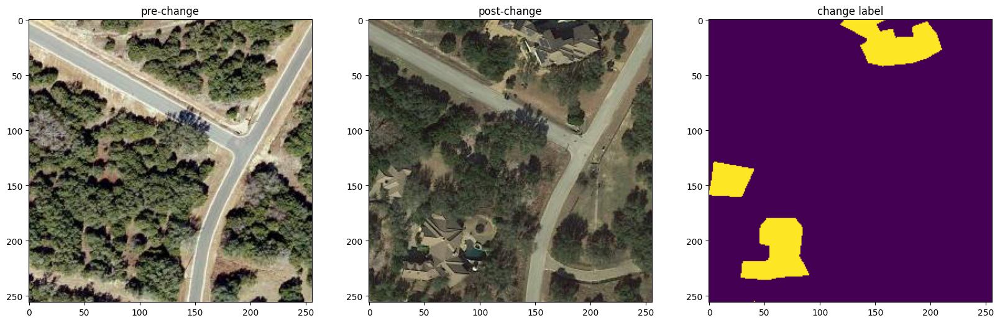

In [19]:
import matplotlib.pyplot as plt
import numpy as np

idx = np.random.randint(0, 8)
print(idx)

for i, data in enumerate(train_loader):
        pre_tensor, post_tensor, label_tensor, fname = data["pre"], data["post"], data["label"], data["fname"]
        print(pre_tensor.shape)

        fig=plt.figure(figsize=(20,8))

        preplot=fig.add_subplot(131)
        preplot.imshow(pre_tensor[idx,:,:,:].permute(1,2,0).numpy())
        preplot.set_title("pre-change")

        postplot=fig.add_subplot(132)
        postplot.set_title("post-change")
        postplot.imshow(post_tensor[idx,:,:,:].permute(1,2,0).numpy())

        labelplot=fig.add_subplot(133)
        labelplot.set_title("change label")
        labelplot.imshow(label_tensor[idx,:,:,:].permute(1,2,0).numpy())

        print(f'fname={fname[0]}')
        break

## Residual U-Net Model for change detection

Creating a change detection network (Use a simple Siamese Residual U-Net as an example):

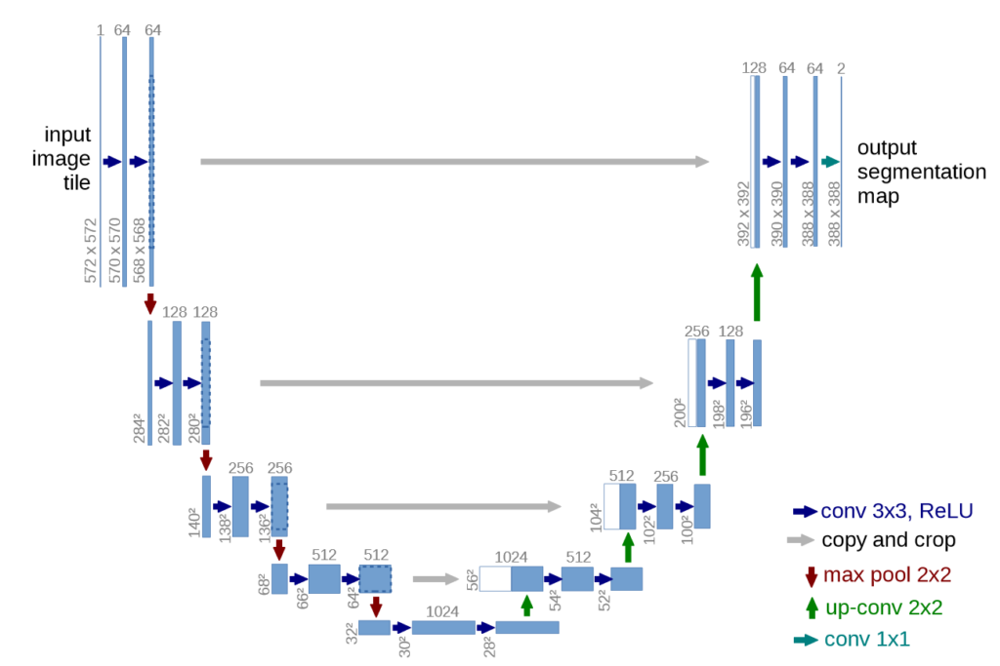

In [21]:
import torch
import torch.nn as nn

class ResidualConv(nn.Module):
    def __init__(self, input_dim, output_dim, stride, padding):
        super(ResidualConv, self).__init__()

        self.conv_block = nn.Sequential(
            nn.BatchNorm2d(input_dim),
            nn.ReLU(),
            nn.Conv2d(
                input_dim, output_dim, kernel_size=3, stride=stride, padding=padding
            ),
            nn.BatchNorm2d(output_dim),
            nn.ReLU(),
            nn.Conv2d(output_dim, output_dim, kernel_size=3, padding=1),
        )
        self.conv_skip = nn.Sequential(
            nn.Conv2d(input_dim, output_dim, kernel_size=3, stride=stride, padding=1),
            nn.BatchNorm2d(output_dim),
        )

    def forward(self, x):

        return self.conv_block(x) + self.conv_skip(x)


class Upsample(nn.Module):
    def __init__(self, input_dim, output_dim, kernel, stride):
        super(Upsample, self).__init__()

        self.upsample = nn.ConvTranspose2d(
            input_dim, output_dim, kernel_size=kernel, stride=stride
        )

    def forward(self, x):
        return self.upsample(x)


class ResUnet(nn.Module):
    def __init__(self, channel=3, filters=[32, 64, 128, 256, 512]):
        super(ResUnet, self).__init__()

        self.input_layer = nn.Sequential(
            nn.Conv2d(channel, filters[0], kernel_size=3, padding=1),
            nn.BatchNorm2d(filters[0]),
            nn.ReLU(),
            nn.Conv2d(filters[0], filters[0], kernel_size=3, padding=1),
        )
        self.input_skip = nn.Sequential(
            nn.Conv2d(channel, filters[0], kernel_size=3, padding=1)
        )

        self.residual_conv_1 = ResidualConv(filters[0], filters[1], 2, 1)
        self.residual_conv_2 = ResidualConv(filters[1], filters[2], 2, 1)
        self.residual_conv_3 = ResidualConv(filters[2], filters[3], 2, 1)
        self.bridge = ResidualConv(filters[3], filters[4], 2, 1)

        self.upsample_1 = Upsample(filters[4], filters[4], 2, 2)
        self.up_residual_conv1 = ResidualConv(filters[4] + filters[3], filters[3], 1, 1)

        self.upsample_2 = Upsample(filters[3], filters[3], 2, 2)
        self.up_residual_conv2 = ResidualConv(filters[3] + filters[2], filters[2], 1, 1)

        self.upsample_3 = Upsample(filters[2], filters[2], 2, 2)
        self.up_residual_conv3 = ResidualConv(filters[2] + filters[1], filters[1], 1, 1)

        self.upsample_4 = Upsample(filters[1], filters[1], 2, 2)
        self.up_residual_conv4 = ResidualConv(filters[1] + filters[0], filters[0], 1, 1)

        self.up_residual_conv5 = ResidualConv(filters[0],filters[0],1,1)

        self.output_layer = nn.Sequential(
            ResidualConv(filters[0],1,1,1),
            # nn.Softmax(dim=1)
            nn.Sigmoid()
        )


    def forward(self,m,n):

        # Encode1
        #stage1
        x1 = self.input_layer(m) + self.input_skip(m)#950*750

        #stage2
        x2 = self.residual_conv_1(x1) #475*375
        #stage3
        x3 = self.residual_conv_2(x2)
        x4 = self.residual_conv_3(x3)
        x5 = self.bridge(x4)
        # Encode2
        y1 = self.input_layer(n) + self.input_skip(n) #32*160*160
        y2 = self.residual_conv_1(y1) #64*80*80
        y3 = self.residual_conv_2(y2) #128*40*40
        y4 = self.residual_conv_3(y3)#256*20*20
        # Bridge

        y5 = self.bridge(y4)#512*10*10

        # Decode
        x5 = self.upsample_1(x5) #512*20*20

        x6 = torch.cat([x5,torch.abs(x4-y4)],dim=1) # 768*20*20
        x7 = self.up_residual_conv1(x6) #256*20*20

        x7 = self.upsample_2(x7) #256*40*40

        x8 = torch.cat([x7, torch.abs(x3-y3)], dim=1) #384*40*40

        x9 = self.up_residual_conv2(x8) #128*40*40

        x9 = self.upsample_3(x9) #128*80*80
        x10 = torch.cat([x9, torch.abs(x2-y2)], dim=1) #192*80*80

        x11 = self.up_residual_conv3(x10) #64*80*80

        x11 = self.upsample_4(x11) #64*160*160
        x12 = torch.cat([x11, torch.abs(x1-y1)], dim=1) #96*160*160

        x13 = self.up_residual_conv4(x12)
        x14 = self.up_residual_conv5(x13)
        output = self.output_layer(x14)

        return output

Let's test the model output with two random PyTorch Tensor. With the input of bitemporal batches of images, we can get a change map from the model.

In [22]:
T1= torch.rand(8,3,256,256)
T2= torch.rand(8,3,256,256)
model=ResUnet()

output=model(T1,T2)
print(output.shape)
# print(label_tensor.shape)

torch.Size([8, 1, 256, 256])


Now we got everything ready for the model training, let's finish the code for the training iterations:

First, let's decide if we can use a graphic card for the learning:

In [23]:
def train(model, train_loader, val_loader, optimizer, loss_function, device, num_epochs, save_path):
    for epoch in range(num_epochs):
        loss_list=[]
        model.train()
        for _, data in enumerate(train_loader):
            optimizer.zero_grad()
            pre_tensor, post_tensor, label_tensor, fname = data["pre"], data["post"], data["label"], data["fname"]
            pre_tensor = pre_tensor.to(device)
            post_tensor = post_tensor.to(device)
            label_tensor = label_tensor.to(device)
            prediction = model(pre_tensor, post_tensor)
            total_loss=loss_function(prediction,label_tensor)
            loss_list.append(total_loss.item()) #only append the loss value and ignore the grad to save memory
            total_loss.backward()
            optimizer.step()
        loss_avg=sum(loss_list)/len(loss_list)
        print(f'Epoch {epoch} training completed, the average loss is {loss_avg}.')

        if (epoch+1) % 10==0:
            model.eval()
            OA_list=[]
            for _, data in enumerate(val_loader):
                pre_tensor, post_tensor, label_tensor, fname = data["pre"], data["post"], data["label"], data["fname"]
                pre_tensor = pre_tensor.to(device)
                post_tensor = post_tensor.to(device)
                label_tensor = label_tensor.to(device)
                probs = model(pre_tensor, post_tensor)
                prediction = torch.where(probs>0.5,1,0)
                true_count=torch.sum(prediction==label_tensor)
                OA=true_count/prediction.numel()
                OA_list.append(OA)
            print("*"*10)
            print(f'Epoch {epoch} evaluation completed, the average OA is {sum(OA_list)/len(OA_list)}')
            print("*"*10)
            torch.save(model.state_dict(),os.path.join(save_path,"ResUnet"+str(epoch)+".pth"))

Now let's start a training process.

In [ ]:
device="cuda" if torch.cuda.is_available() else "cpu"
print(device)
model=model.to(device)
optimizer=torch.optim.Adam(model.parameters(),lr=1e-4)
loss_function=torch.nn.BCELoss()
num_epochs=30
save_path="./checkpoint/"
os.makedirs(save_path, exist_ok=True)
train(model, train_loader=train_loader, val_loader=val_loader, optimizer=optimizer, loss_function=loss_function, device=device, num_epochs=num_epochs, save_path=save_path)

cuda
Epoch 0 training completed, the average loss is 0.5377289627710086.
Epoch 1 training completed, the average loss is 0.4109328487281049.
Epoch 2 training completed, the average loss is 0.20345018264115527.
Epoch 3 training completed, the average loss is 0.11792242163687609.
Epoch 4 training completed, the average loss is 0.07687445740016659.
Epoch 5 training completed, the average loss is 0.05426965584831961.
Epoch 6 training completed, the average loss is 0.04362041406919447.
Epoch 7 training completed, the average loss is 0.03827870584542999.
Epoch 8 training completed, the average loss is 0.03210476768632116.
Epoch 9 training completed, the average loss is 0.03073814056886967.
**********
Epoch 9 evaluation completed, the average OA is 0.989715576171875
**********
Epoch 10 training completed, the average loss is 0.027663170214574994.
Epoch 11 training completed, the average loss is 0.024645870176321836.
Epoch 12 training completed, the average loss is 0.02349138415439494.
Epoch 1

## Accuracy Assignment
Prepare a function to calculate the evaluation measurements:

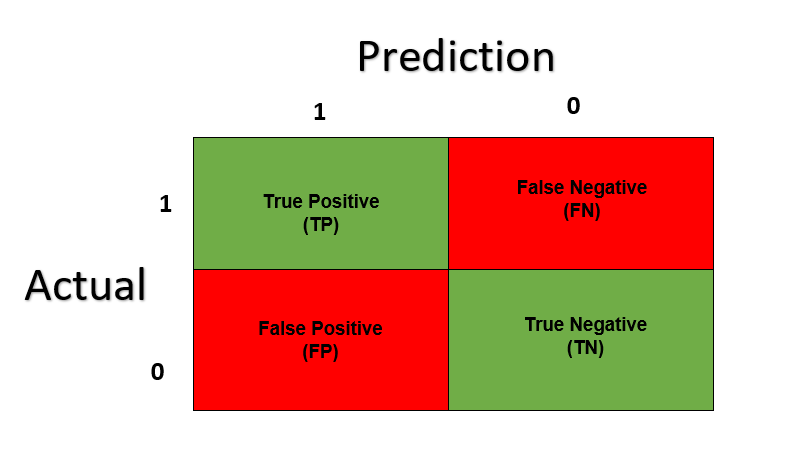

In [24]:
def confusion(prediction, truth):
    """ Returns the confusion matrix for the values in the `prediction` and `truth`
    tensors, i.e. the amount of positions where the values of `prediction`
    and `truth` are
    - 1 and 1 (True Positive)
    - 1 and 0 (False Positive)
    - 0 and 0 (True Negative)
    - 0 and 1 (False Negative)
    """

    confusion_vector = prediction / truth
    # Element-wise division of the 2 tensors returns a new tensor which holds a
    # unique value for each case:
    #   1     where prediction and truth are 1 (True Positive)
    #   inf   where prediction is 1 and truth is 0 (False Positive)
    #   nan   where prediction and truth are 0 (True Negative)
    #   0     where prediction is 0 and truth is 1 (False Negative)

    true_positives = torch.sum(confusion_vector == 1).item()
    false_positives = torch.sum(confusion_vector == float('inf')).item()
    true_negatives = torch.sum(torch.isnan(confusion_vector)).item()
    false_negatives = torch.sum(confusion_vector == 0).item()

    return true_positives, false_positives, true_negatives, false_negatives

Now let's test the model with the test dataset:

In [26]:
from torchvision.utils import save_image

model = ResUnet()
device = "cuda" if torch.cuda.is_available() else "cpu"
model=model.to(device)
model.load_state_dict(torch.load("./ResUnet19.pth"))

test_results_path="./test_results/"
os.makedirs(test_results_path,exist_ok=True)
TP=0
TN=0
FP=0
FN=0
for _, data in enumerate(test_loader):
    pre_tensor, post_tensor, label_tensor, fname = data["pre"], data["post"], data["label"], data["fname"]
    pre_tensor = pre_tensor.to(device)
    post_tensor = post_tensor.to(device)
    label_tensor = label_tensor.to(device)
    probs = model(pre_tensor, post_tensor)
    prediction = torch.where(probs>0.5,1.0,0.0)
    true_positives, false_positives, true_negatives, false_negatives = confusion(prediction,label_tensor)
    TP+=true_positives
    TN+=true_negatives
    FP+=false_positives
    FN+=false_negatives
    for i in range(prediction.shape[0]):
        save_image(prediction[i,:,:,:].cpu(), os.path.join(test_results_path, fname[i]))


<ipython-input-26-f34c8d6d8357>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("./ResUnet19.pth"))


In [62]:
print(f'TP={TP}, TN={TN}, FP={FP}, FN={FN}')

TP=5860706, TN=126724360, FP=655964, FN=976698


Calculate the quantitative results:

In [64]:
OA=(TP+TN)/(TP+TN+FP+FN)
Precision=TP/(TP+FP)
Recall=TP/(TP+FN)
F1_score=2*Precision*Recall/(Precision+Recall)

print(f'OA={OA:.3f}, Precision={Precision:.3f}, Recall={Recall:.3f}, F1-score={F1_score:.3f}')

OA=0.988, Precision=0.899, Recall=0.857, F1-score=0.878


2


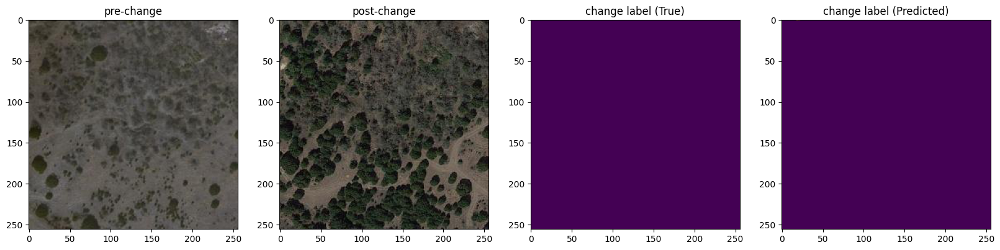

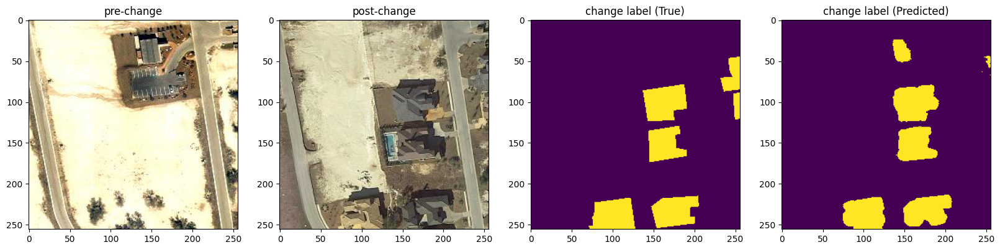

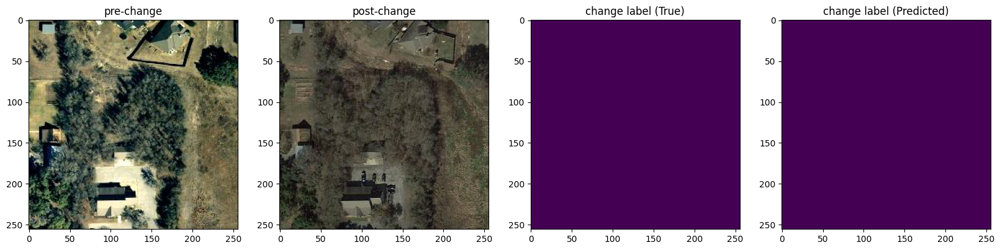

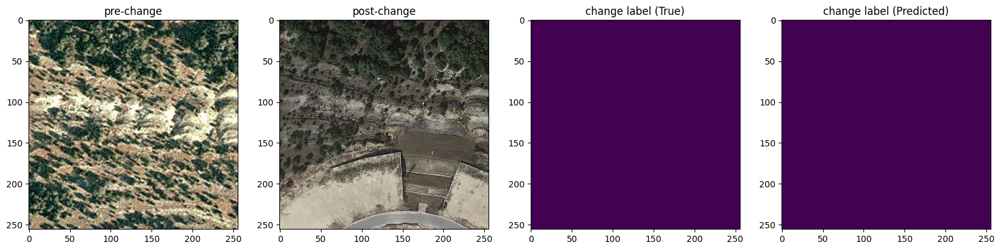

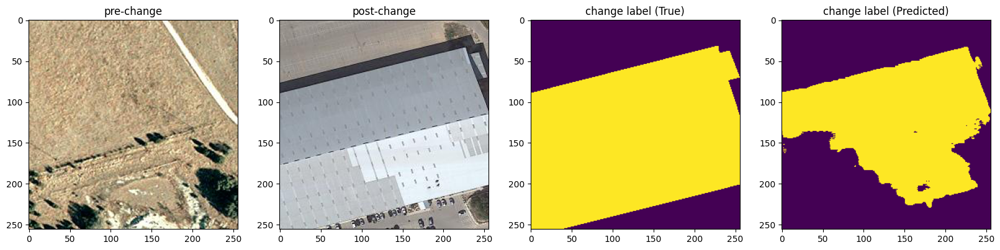

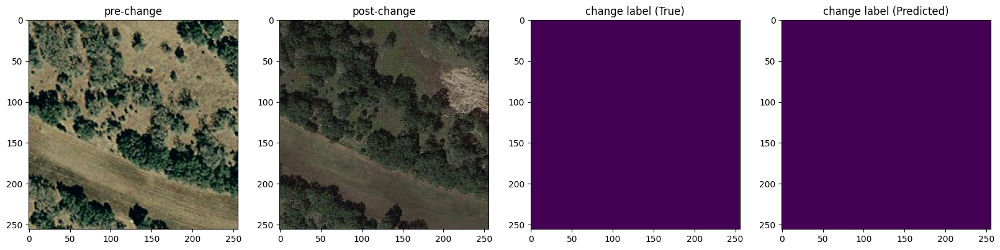

In [67]:
idx = np.random.randint(0, 4)
print(idx)

for i, data in enumerate(test_loader):
        pre_tensor, post_tensor, label_tensor, fname = data["pre"], data["post"], data["label"], data["fname"]
        # print(pre_tensor.shape, fname)

        prediction_tensor = [Image.open(os.path.join(test_results_path, fname[j])).convert("1") for j in range(4)]

        # Convert list of PIL Images to NumPy array
        prediction_np = np.array([np.array(transforms.ToTensor()(img)) for img in prediction_tensor])

        fig=plt.figure(figsize=(20,8))

        preplot=fig.add_subplot(141)
        preplot.imshow(pre_tensor[idx,:,:,:].permute(1,2,0).numpy())
        preplot.set_title("pre-change")

        postplot=fig.add_subplot(142)
        postplot.set_title("post-change")
        postplot.imshow(post_tensor[idx,:,:,:].permute(1,2,0).numpy())

        labelplot=fig.add_subplot(143)
        labelplot.set_title("change label (True)")
        labelplot.imshow(label_tensor[idx,:,:,:].permute(1,2,0).numpy())

        prediction=fig.add_subplot(144)
        prediction.set_title("change label (Predicted)")
        prediction.imshow(prediction_np[idx, :,:,:].transpose(1, 2, 0))

        # print(f'fname={fname[0]}')
        if i == 5:
          break

## Test on custom dataset

In [68]:
test_imgs = glob.glob('./test_data/**/*.png')
save_path = "./test_data/cropped"

# !rm -rf ./test_data/cropped/test_data # if directory is already exist
with ThreadPoolExecutor() as executor:
    executor.map(process_image, test_imgs)

print("Processing complete!")

Processing: test_data/B/test_img1
Processing: test_data/A/test_img1
Processing complete!


In [69]:
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import os
from PIL import Image
from torchvision import transforms

class change_detection_dataset(Dataset):
    def __init__(self,root_path) -> None:
        super().__init__()

        # connect the folders
        self.pre_change_path=os.path.join(root_path,"A")
        self.post_change_path=os.path.join(root_path,"B")
        # self.change_label_path=os.path.join(root_path,"label")
        self.fname_list=os.listdir(self.pre_change_path)
        # print(self.pre_change_path, self.post_change_path, self.change_label_path, self.fname_list)

    # Read each pair and convert to RGB
    def __getitem__(self, index):
        fname=self.fname_list[index]
        pre_img=Image.open(os.path.join(self.pre_change_path,fname)).convert("RGB")
        post_img=Image.open(os.path.join(self.post_change_path,fname)).convert("RGB")
        # change_label=Image.open(os.path.join(self.change_label_path,fname)).convert("1")

        # add to tensor
        transform=transforms.Compose([
            transforms.ToTensor()
        ])
        pre_tensor=transform(pre_img)
        post_tensor=transform(post_img)
        # label_tensor=transform(change_label)

        # return dict of pre, post, label and fname
        return {'pre':pre_tensor,'post':post_tensor,'fname':fname}

    def __len__(self):
        return len(self.fname_list)

In [70]:
test_path = "./test_data/cropped/test_data/"

test_loader=DataLoader(change_detection_dataset(root_path=test_path),batch_size=4,shuffle=False,num_workers=0,pin_memory=False)

# test_loader.__getitem__(1)

In [71]:
from torchvision.utils import save_image

model = ResUnet()
model=model.to(device)
model.load_state_dict(torch.load("./ResUnet19.pth"))

test_results_path="./test_data/cropped/test_data/test_prediction/"
os.makedirs(test_results_path,exist_ok=True)

for _, data in enumerate(test_loader):
    pre_tensor, post_tensor, fname = data["pre"], data["post"], data["fname"]

    # push to device
    pre_tensor = pre_tensor.to(device)
    post_tensor = post_tensor.to(device)

    # prediction and probability check
    probs = model(pre_tensor, post_tensor)
    prediction = torch.where(probs>0.5,1.0,0.0)

    for i in range(prediction.shape[0]):
        save_image(prediction[i,:,:,:].cpu(), os.path.join(test_results_path, fname[i]))

<ipython-input-71-0b8246e6f9d1>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("./ResUnet19.pth"))


['./test_data/cropped/test_data/A/test_img1_1_0.png', './test_data/cropped/test_data/A/test_img1_1_3.png', './test_data/cropped/test_data/A/test_img1_0_0.png', './test_data/cropped/test_data/A/test_img1_3_1.png', './test_data/cropped/test_data/A/test_img1_3_2.png', './test_data/cropped/test_data/A/test_img1_0_3.png', './test_data/cropped/test_data/A/test_img1_1_2.png', './test_data/cropped/test_data/A/test_img1_1_1.png', './test_data/cropped/test_data/A/test_img1_2_0.png', './test_data/cropped/test_data/A/test_img1_3_0.png', './test_data/cropped/test_data/A/test_img1_0_2.png', './test_data/cropped/test_data/A/test_img1_0_1.png', './test_data/cropped/test_data/A/test_img1_2_3.png', './test_data/cropped/test_data/A/test_img1_3_3.png', './test_data/cropped/test_data/A/test_img1_2_1.png', './test_data/cropped/test_data/A/test_img1_2_2.png']


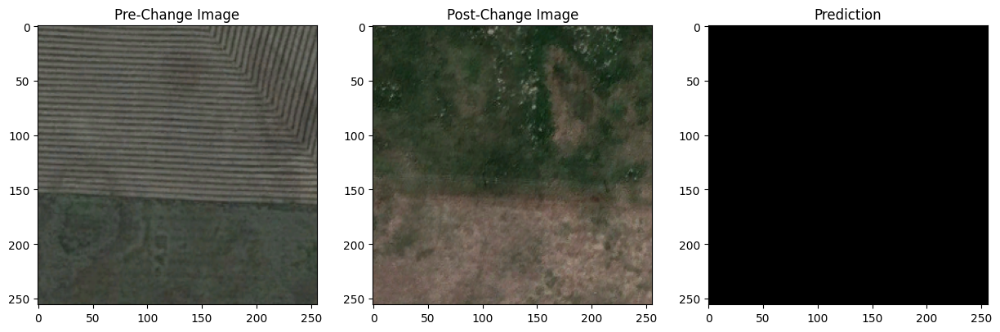

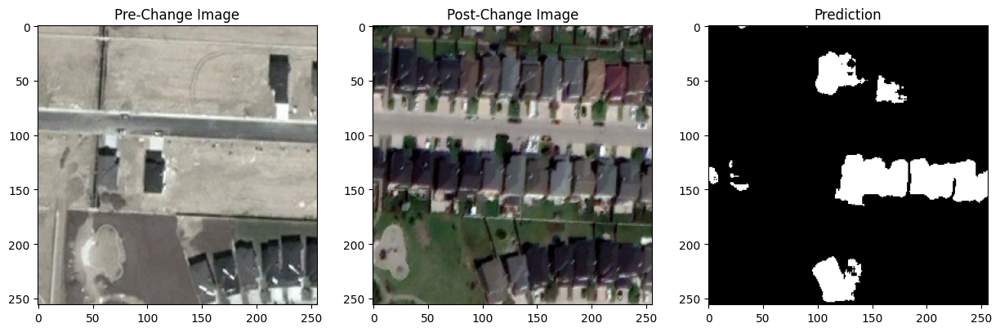

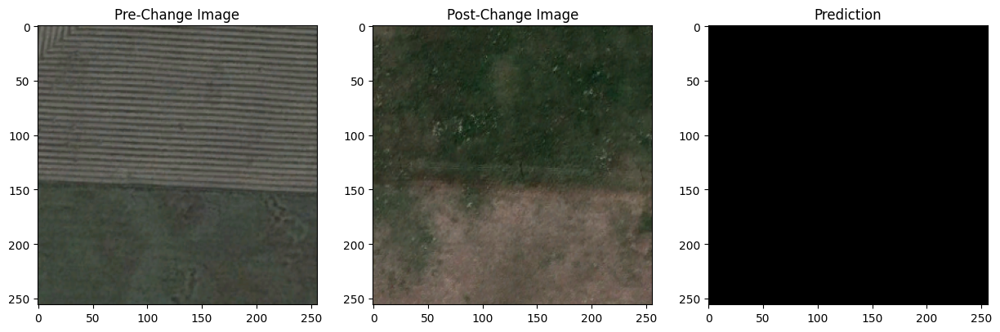

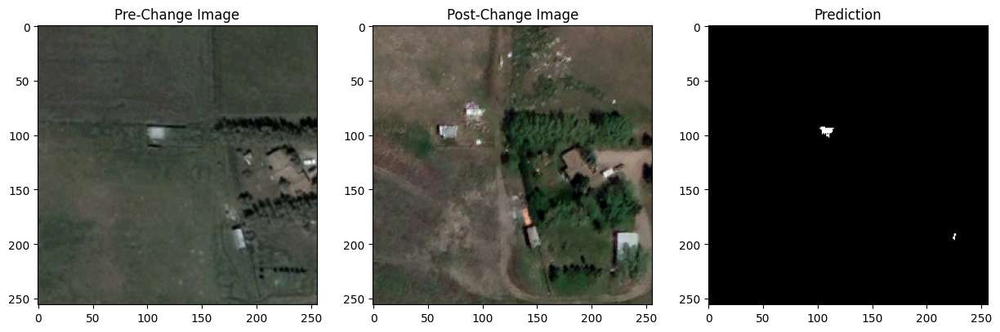

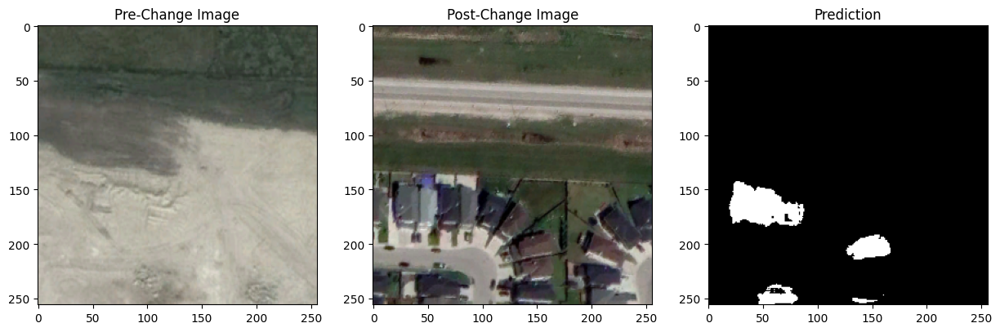

...

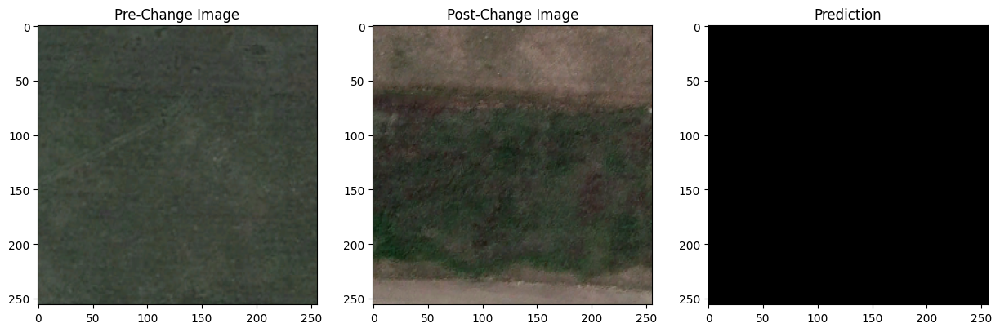

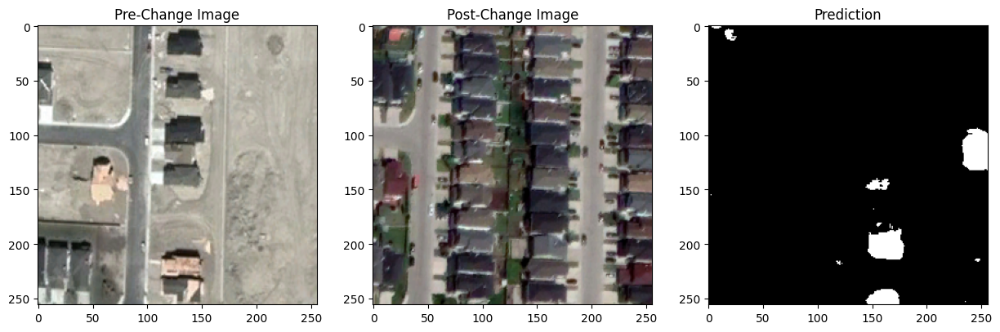

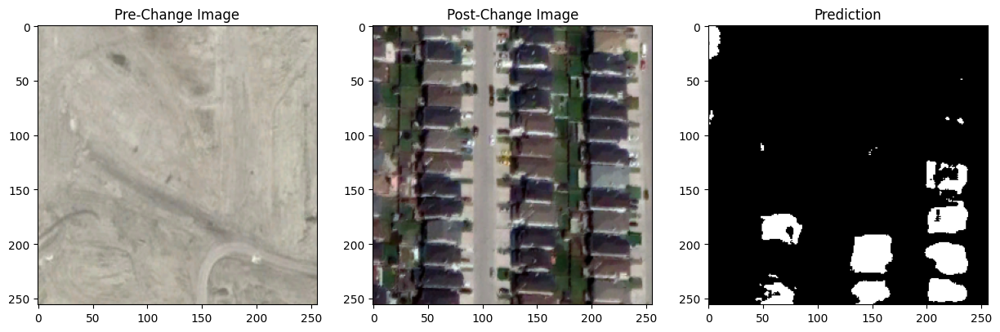

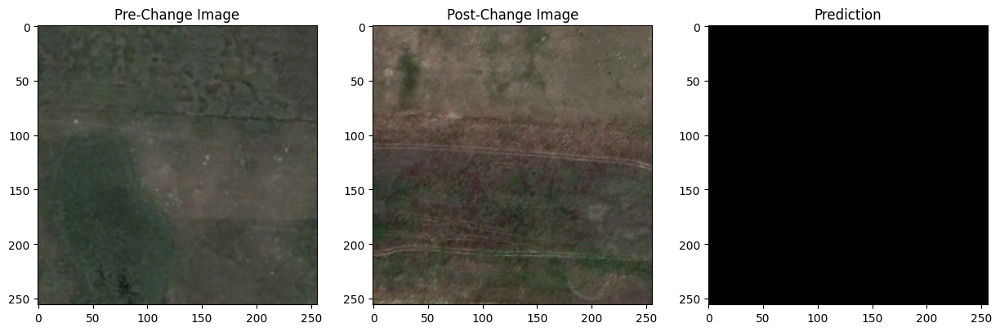

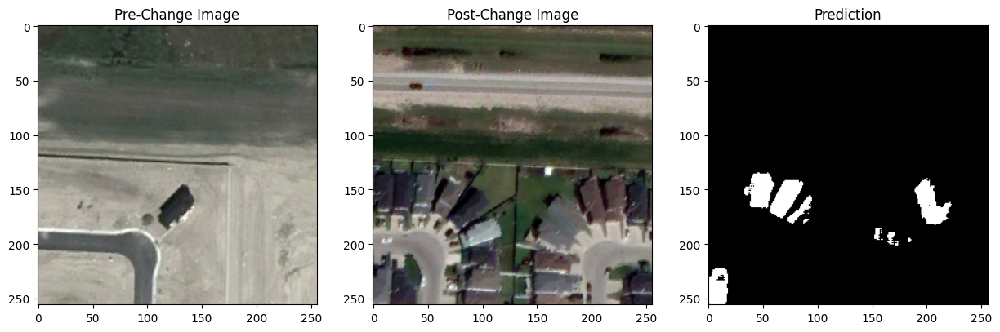

In [72]:
pre_file_paths = glob.glob('./test_data/cropped/test_data/A/*.png')
print(pre_file_paths)

for i, pre_img_path in enumerate(pre_file_paths):
    post_img_path = pre_img_path.replace('A', 'B')
    pred_path = pre_img_path.replace('A', 'test_prediction')

    pre_img = Image.open(pre_img_path).convert('RGB')
    post_img = Image.open(post_img_path).convert('RGB')
    pred_img = Image.open(pred_path).convert('L')

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(pre_img)
    ax[0].set_title('Pre-Change Image')
    ax[1].imshow(post_img)
    ax[1].set_title('Post-Change Image')
    ax[2].imshow(pred_img, cmap='gray')
    ax[2].set_title('Prediction')
    plt.show()


## References

1. [A Spatial-Temporal Attention-Based Method and a New Dataset for Remote Sensing Image Change Detection: Original Paper](https://www.mdpi.com/2072-4292/12/10/1662)

2. [Chand Detection Tutorial in GitHub](https://github.com/EricYu97/CDTutorial?tab=readme-ov-file)

3. [AI4RS/UCD GitHub](https://github.com/AI4RS/UCD)